# TC 5033
## Deep Learning
## Convolutional Neural Networks
<br>

#### Activity 2b: Building a CNN for CIFAR10 dataset with PyTorch
<br>

- Objective

    The main goal of this activity is to further your understanding of Convolutional Neural Networks (CNNs) by building one using PyTorch. You will apply this architecture to the famous CIFAR10 dataset, taking what you've learned from the guide code that replicated the Fully Connected model in PyTorch (Activity 2a).

- Instructions
    This activity requires submission in teams of 5 or 6 members. Submissions from smaller or larger teams will not be accepted unless prior approval has been granted (only due to exceptional circumstances). While teamwork is encouraged, each member is expected to contribute individually to the assignment. The final submission should feature the best arguments and solutions from each team member. Only one person per team needs to submit the completed work, but it is imperative that the names of all team members are listed in a Markdown cell at the very beginning of the notebook (either the first or second cell). Failure to include all team member names will result in the grade being awarded solely to the individual who submitted the assignment, with zero points given to other team members (no exceptions will be made to this rule).

    Understand the Guide Code: Review the guide code from Activity 2a that implemented a Fully Connected model in PyTorch. Note how PyTorch makes it easier to implement neural networks.

    Familiarize Yourself with CNNs: Take some time to understand their architecture and the rationale behind using convolutional layers.

    Prepare the Dataset: Use PyTorch's DataLoader to manage the dataset. Make sure the data is appropriately preprocessed for a CNN.

    Design the CNN Architecture: Create a new architecture that incorporates convolutional layers. Use PyTorch modules like nn.Conv2d, nn.MaxPool2d, and others to build your network.

    Training Loop and Backpropagation: Implement the training loop, leveraging PyTorch’s autograd for backpropagation. Keep track of relevant performance metrics.

    Analyze and Document: Use Markdown cells to explain your architectural decisions, performance results, and any challenges you faced. Compare this model with your previous Fully Connected model in terms of performance and efficiency.

- Evaluation Criteria

    - Understanding of CNN architecture and its application to the CIFAR10 dataset
    - Code Readability and Comments
    - Appropriateness and efficiency of the chosen CNN architecture
    - Correct implementation of Traning Loop and Accuracy Function
    - Model's performance metrics on the CIFAR10 dataset (at least 65% accuracy)
    - Quality of Markdown documentation

- Submission

Submit via Canvas your Jupyter Notebook with the CNN implemented in PyTorch. Your submission should include well-commented code and Markdown cells that provide a comprehensive view of your design decisions, performance metrics, and learnings.

# CIFAR-10 Image Classification with PyTorch

In this notebook, we explore image classification on the CIFAR-10 dataset using PyTorch.  
The goal is to compare a **linear classifier baseline** against a **convolutional neural network (CNN)** and analyze how model capacity and inductive bias affect performance on image data.

The workflow includes:
- Data loading and preprocessing
- Exploratory visualization of the dataset
- Training a linear baseline model
- Improving the baseline through hyperparameter tuning
- Training a CNN model
- Comparing both models using accuracy and loss curves



## Dataset: CIFAR-10

CIFAR-10 is a widely used benchmark dataset for image classification.  
It consists of **60,000 color images** of size **32×32**, distributed across **10 classes**:

- airplane
- automobile
- bird
- cat
- deer
- dog
- frog
- horse
- ship
- truck

The dataset is split into:
- 50,000 training images
- 10,000 test images

A subset of the training data is used as a validation set for model selection.



Carlos Fernando Del Castillo Rey A01796595

Uriel Derrant Soriano            A01373541

Julio Miguel Díaz de León García. A01796215

Luis Ángel Díaz Rebollo.         A01365832

In [19]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch.utils.data import sampler
import torchvision.datasets as datasets
import torchvision.transforms as T
import matplotlib.pyplot as plt
import copy
import itertools
import pandas as pd
#only if you have jupyterthemes
from jupyterthemes import jtplot
jtplot.style()

### Download Cifar10 dataset

In [20]:
torch.cuda.is_available()

False

## Data Preprocessing

Images are converted to PyTorch tensors and normalized using channel-wise statistics.
Normalization helps stabilize training by ensuring that input values have a similar scale.

No data augmentation is applied for the linear baseline, as the goal is to establish a simple and interpretable reference model.


In [21]:
DATA_PATH = r'C:\Users\52614\Downloads\cifar-10-batches-py'
NUM_TRAIN = 50000
NUM_VAL = 5000
NUM_TEST = 5000
MINIBATCH_SIZE = 64

transform_cifar = T.Compose([
                T.ToTensor(),
                T.Normalize([0.491, 0.482, 0.447], [0.247, 0.243, 0.261])
            ])

# Train dataset
cifar10_train = datasets.CIFAR10(DATA_PATH, train=True, download=True,
                             transform=transform_cifar)
train_loader = DataLoader(cifar10_train, batch_size=MINIBATCH_SIZE, 
                          sampler=sampler.SubsetRandomSampler(range(NUM_TRAIN)))
#Validation set
cifar10_val = datasets.CIFAR10(DATA_PATH, train=False, download=True,
                           transform=transform_cifar)
val_loader = DataLoader(cifar10_val, batch_size=MINIBATCH_SIZE, 
                        sampler=sampler.SubsetRandomSampler(range(NUM_VAL)))
#Test set
cifar10_test = datasets.CIFAR10(DATA_PATH, train=False, download=True, 
                            transform=transform_cifar)
test_loader = DataLoader(cifar10_test, batch_size=MINIBATCH_SIZE,
                        sampler=sampler.SubsetRandomSampler(range(NUM_VAL, len(cifar10_test))))

## Exploratory Data Analysis

Before training the models, we visualize random samples from the dataset to:
- Verify correct data loading
- Confirm label consistency
- Gain intuition about class variability and difficulty

Both individual samples and class-wise grids are displayed.


In [22]:
cifar10_train

Dataset CIFAR10
    Number of datapoints: 50000
    Root location: C:\Users\52614\Downloads\cifar-10-batches-py
    Split: Train
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=[0.491, 0.482, 0.447], std=[0.247, 0.243, 0.261])
           )

In [23]:
train_loader.batch_size

64

In [24]:
for i, (x, y) in enumerate(train_loader):
    print(x, y)

tensor([[[[ 1.9178,  1.9813,  1.9655,  ...,  1.3780,  0.1396, -0.9559],
          [ 0.9811,  1.0129,  1.0922,  ...,  1.5368,  0.2825, -0.8130],
          [ 0.3302,  0.3619,  0.3619,  ...,  1.6003,  0.4730, -0.6383],
          ...,
          [ 0.9970,  0.9811,  0.8382,  ..., -0.5907, -0.6224, -0.6701],
          [ 0.9335,  0.9970,  1.0129,  ..., -0.1144, -0.1144, -0.1303],
          [ 1.0764,  1.1558,  1.0922,  ...,  0.2984,  0.2984,  0.3143]],

         [[ 2.0671,  2.0994,  2.0671,  ...,  1.1150, -0.6602, -1.6769],
          [ 0.8729,  0.8406,  0.8568,  ...,  1.3409, -0.4666, -1.5962],
          [-0.4666, -0.4343, -0.4181,  ...,  1.4539, -0.1922, -1.4671],
          ...,
          [-0.2729, -0.3374, -0.5150,  ..., -1.5317, -1.5317, -1.5317],
          [-0.4504, -0.4504, -0.4666,  ..., -1.2896, -1.2896, -1.2896],
          [-0.3697, -0.3697, -0.4181,  ..., -0.9991, -0.9991, -0.9668]],

         [[ 2.1188,  2.1188,  2.1188,  ...,  1.0971, -0.6459, -1.5323],
          [ 1.1722,  1.1722,  

### Using  GPUs

## GPU Configuration

We check whether a GPU is available to accelerate training.
If a GPU is not available, the model is trained using the CPU.


In [25]:
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')
print(device)

cpu


In [39]:
def set_global_seed(seed: int = 42):
    import random
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

@torch.no_grad()
def evaluate_loss_acc(model, loader, device):
    model.eval()
    num_correct, num_total = 0, 0
    loss_sum = 0.0

    for xi, yi in loader:
        xi = xi.to(device=device, dtype=torch.float32)
        yi = yi.to(device=device, dtype=torch.long)

        logits = model(xi)
        loss = F.cross_entropy(logits, yi)

        bs = yi.size(0)
        loss_sum += loss.item() * bs
        num_correct += (logits.argmax(dim=1) == yi).sum().item()
        num_total += bs

    return loss_sum / num_total, num_correct / num_total


def train_with_history(
    model, optimizer, device,
    train_loader, val_loader,
    epochs=10, print_every=1
):
    model = model.to(device=device)
    history = {"epoch": [], "train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []}

    for epoch in range(1, epochs + 1):
        model.train()
        train_correct, train_total, train_loss_sum = 0, 0, 0.0

        for xi, yi in train_loader:
            xi = xi.to(device=device, dtype=torch.float32)
            yi = yi.to(device=device, dtype=torch.long)

            logits = model(xi)
            loss = F.cross_entropy(logits, yi)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            bs = yi.size(0)
            train_loss_sum += loss.item() * bs
            train_correct += (logits.argmax(dim=1) == yi).sum().item()
            train_total += bs

        train_loss = train_loss_sum / train_total
        train_acc = train_correct / train_total
        val_loss, val_acc = evaluate_loss_acc(model, val_loader, device)

        history["epoch"].append(epoch)
        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)
        history["val_loss"].append(val_loss)
        history["val_acc"].append(val_acc)

        if print_every and (epoch % print_every == 0):
            print(f"Epoch {epoch:02d}/{epochs} | train_acc={train_acc:.4f} | val_acc={val_acc:.4f}")


    return history


### Mostrar imágenes

La imagen muestreada representa un: truck


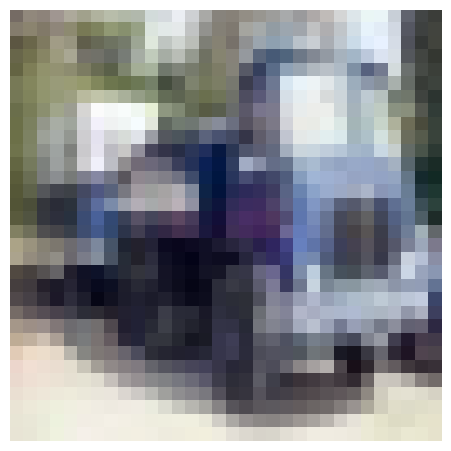

In [27]:
classes = test_loader.dataset.classes
def plot_figure(image):
    plt.imshow(np.transpose(image,(1,2,0)))
    plt.axis('off')
    plt.show()

rnd_sample_idx = np.random.randint(len(test_loader))
print(f'La imagen muestreada representa un: {classes[test_loader.dataset[rnd_sample_idx][1]]}')
image = test_loader.dataset[rnd_sample_idx][0]
image = (image - image.min()) / (image.max() -image.min() )
plot_figure(image)


**plot_cifar10_grid()**

**Description:** Displays a CIFAR-10 image grid with 8 random test images per class (one column per class).

**Flow**

Read class names from test_loader.dataset.classes

Set total_samples = 8 and create the figure

For each class label:

* Find all dataset indices with that label (targets)

* Randomly select total_samples indices (no replacement)

* Plot each selected image in its subplot position

* Add the class title only on the first row

Show the full grid with plt.show()

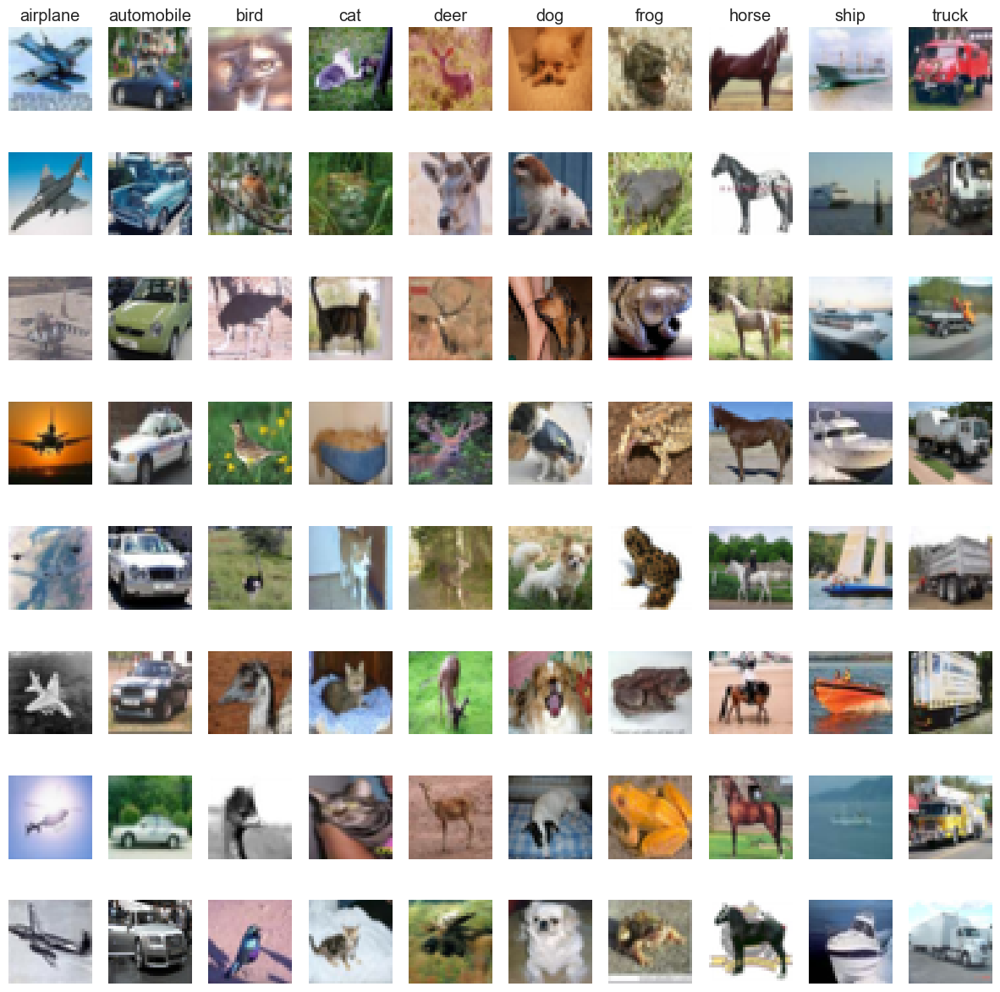

In [28]:
def plot_cifar10_grid():
    classes = test_loader.dataset.classes
    total_samples = 8
    plt.figure(figsize=(15,15))
    for label, sample in enumerate(classes):
        class_idxs = np.flatnonzero(label == np.array(test_loader.dataset.targets))
        sample_idxs = np.random.choice(class_idxs, total_samples, replace = False)
        for i, idx in enumerate(sample_idxs):
            plt_idx = i*len(classes) + label + 1
            plt.subplot(total_samples, len(classes), plt_idx)
            plt.imshow(test_loader.dataset.data[idx])
            plt.axis('off')
            
            if i == 0: plt.title(sample)
    plt.show()

plot_cifar10_grid() 

### Calcular accuracy


**accuracy(model, loader)**

**Description:** Evaluates the model on a data loader and returns average loss and accuracy.

**Overview**

Sets evaluation mode: model.eval()

Disables gradient tracking: torch.no_grad()

For each batch in loader:

* Moves xi, yi to device

* Computes logits: scores = model(xi)

* Computes loss: F.cross_entropy(scores, yi)

* Accumulates total loss and correct predictions

Returns:

* avg_loss = cost_sum / num_total

* acc = num_correct / num_total

In [ ]:
def accuracy(model, loader):
    model.eval()
    num_correct = 0
    num_total = 0
    cost_sum = 0.0

    with torch.no_grad():
        for xi, yi in loader:
            xi = xi.to(device=device, dtype=torch.float32)
            yi = yi.to(device=device, dtype=torch.long)

            scores = model(xi)                     # logits (B,10)
            loss = F.cross_entropy(scores, yi)

            bs = yi.size(0)
            cost_sum += loss.item() * bs
            num_correct += (scores.argmax(dim=1) == yi).sum().item()
            num_total += bs

    return cost_sum / num_total, num_correct / num_total



### Loop de entrenamiento

**plot_figure(image)**

**Description:** Plots a single image sample using matplotlib (hides axes).

**Flow**

* Convert image from CHW (C, H, W) to HWC (H, W, C) for matplotlib

* Display the image with plt.imshow()

* Hide axes (plt.axis('off'))

* Show the figure (plt.show())

**train(model, optimiser, epochs=10)**

**Description:** Trains the model on train_loader and evaluates on val_loader each epoch.

**Flow**

* Move model to device

* For each epoch:

model.train() and reset counters

* For each batch:

forward → loss → backprop → optimizer step

* accumulate loss and correct predictions

* compute train_loss/train_acc

* compute val_loss/val_acc with accuracy()

* print metrics

In [ ]:
def train_linear_with_history(
    model,
    optimizer,
    device,
    train_loader,
    val_loader,
    epochs=30
):
    """
    Train a linear classifier while storing training and validation metrics
    at each epoch.

    This function is specifically designed for simple models (e.g. linear
    classifiers) where we want to analyze learning dynamics over time.

    Returns:
    - history: dictionary containing per-epoch metrics
    - model: trained model
    """

    # Move model parameters to the selected device (CPU or GPU)
    model = model.to(device)

    # Dictionary to store metrics for later visualization
    history = {
        "epoch": [],        # epoch index
        "train_loss": [],   # training loss per epoch
        "train_acc": [],    # training accuracy per epoch
        "val_loss": [],     # validation loss per epoch
        "val_acc": []       # validation accuracy per epoch
    }

    # Main training loop
    for epoch in range(1, epochs + 1):

        # Enable training mode (important for layers like Dropout/BatchNorm)
        model.train()

        correct = 0          # number of correct predictions
        total = 0            # total number of samples
        loss_sum = 0.0       # accumulated loss (weighted by batch size)

        # Iterate over training batches
        for xi, yi in train_loader:
            # Move batch data to device
            xi = xi.to(device=device, dtype=torch.float32)
            yi = yi.to(device=device, dtype=torch.long)

            # Forward pass: compute logits
            logits = model(xi)

            # Compute cross-entropy loss
            loss = F.cross_entropy(logits, yi)

            # Backpropagation step
            optimizer.zero_grad()  # clear previous gradients
            loss.backward()        # compute gradients
            optimizer.step()       # update model parameters

            # Batch size for weighted averaging
            bs = yi.size(0)

            # Accumulate loss and accuracy statistics
            loss_sum += loss.item() * bs
            correct += (logits.argmax(dim=1) == yi).sum().item()
            total += bs

        # Compute epoch-level training metrics
        train_loss = loss_sum / total
        train_acc = correct / total

        # Evaluate model on validation set (no gradients)
        val_loss, val_acc = accuracy(model, val_loader)

        # Store metrics for later analysis/plotting
        history["epoch"].append(epoch)
        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)
        history["val_loss"].append(val_loss)
        history["val_acc"].append(val_acc)

        # Print progress for monitoring convergence
        print(
            f"Epoch {epoch:02d}/{epochs} | "
            f"train_acc={train_acc:.4f} | "
            f"val_acc={val_acc:.4f}"
        )

    # Return both the history and the trained model
    return history, model


### Linear model

## Linear Classifier Baseline

As an initial baseline, we train a **linear classifier (softmax regression)** that operates directly on flattened pixel values.

Characteristics of this model:
- No spatial awareness
- No feature hierarchy
- Fast to train
- Serves as a lower bound for performance on CIFAR-10

This baseline helps quantify how much performance improvement is gained by introducing convolutional layers.


In [44]:
# To do: Use PyTorch to create a linear model to have an initial baseline model

## Hyperparameter Selection for the Linear Model

The linear classifier is trained using the Adam optimizer.
Based on empirical evidence for CIFAR-10, the following configuration provides a strong baseline:

- Optimizer: Adam
- Learning rate: 1e-3
- Weight decay (L2 regularization): 1e-4
- Epochs: 30

These values balance convergence speed and generalization without excessive computational cost.


In [53]:
epochs = 30

linear_model = nn.Sequential(
    nn.Flatten(),
    nn.Linear(32 * 32 * 3, 10)
)

linear_optimizer = torch.optim.Adam(
    linear_model.parameters(),
    lr=1e-3,
    weight_decay=1e-4
)

linear_history, linear_model = train_linear_with_history(
    model=linear_model,
    optimizer=linear_optimizer,
    device=device,
    train_loader=train_loader,
    val_loader=val_loader,
    epochs=epochs
)


Epoch 01/30 | train_acc=0.3413 | val_acc=0.3780
Epoch 02/30 | train_acc=0.3647 | val_acc=0.3610
Epoch 03/30 | train_acc=0.3713 | val_acc=0.3598
Epoch 04/30 | train_acc=0.3777 | val_acc=0.3578
Epoch 05/30 | train_acc=0.3812 | val_acc=0.3668
Epoch 06/30 | train_acc=0.3831 | val_acc=0.3620
Epoch 07/30 | train_acc=0.3842 | val_acc=0.3728
Epoch 08/30 | train_acc=0.3855 | val_acc=0.3832
Epoch 09/30 | train_acc=0.3879 | val_acc=0.3500
Epoch 10/30 | train_acc=0.3887 | val_acc=0.3630
Epoch 11/30 | train_acc=0.3903 | val_acc=0.3656
Epoch 12/30 | train_acc=0.3931 | val_acc=0.3782
Epoch 13/30 | train_acc=0.3921 | val_acc=0.3620
Epoch 14/30 | train_acc=0.3934 | val_acc=0.3584
Epoch 15/30 | train_acc=0.3899 | val_acc=0.3458
Epoch 16/30 | train_acc=0.3925 | val_acc=0.3572
Epoch 17/30 | train_acc=0.3942 | val_acc=0.3758
Epoch 18/30 | train_acc=0.3925 | val_acc=0.3418
Epoch 19/30 | train_acc=0.3967 | val_acc=0.3574
Epoch 20/30 | train_acc=0.3975 | val_acc=0.3646
Epoch 21/30 | train_acc=0.3937 | val_acc

### Sequential CNN

### Why this model is good for ASL (Appropriateness and efficiency of the chosen CNN architecture)

* **CNN model:** ASL images depend on the hand shape (fingers, edges, and position). A CNN fits this task because it learns local image patterns. Convolution filters detect small features, and pooling helps the model be less sensitive to small shifts in the image. CNNs are also more parameter-efficient than fully connected networks for image
* **Not too big:** The network is **small/medium**, so it can learn useful features without overfitting too easily.
* **Simple ending:** **Global average pooling + one linear layer** keeps the model simple and reduces the number of parameters.
* **Training settings:** **Adam (lr=1e-3)** is stable and fast. **20–30 epochs** is a good start if we watch the validation results.


**Description:** Small CNN for image classification (feature extractor + classifier).

Methods
__init__(num_classes=10)

* Defines features (Conv2d + ReLU + MaxPool)

* Defines pool (AdaptiveAvgPool2d → 1×1)

* Defines fc (Linear → num_classes)

* Spatial downsampling: 32×32 → 16×16 → 8×8

forward(x)

* x = features(x) (extract features)

* x = pool(x) → (B,128,1,1)

* flatten → (B,128)

* return logits → (B,num_classes)

In [46]:
# To do: Use PyTorch to implement a CNN model, accuracy should be better than 
#the linear model

In [47]:
class SimpleCNN(nn.Module):
    def __init__(self, num_classes=10):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, 3, padding=1), nn.ReLU(),
            nn.MaxPool2d(2),  # 32->16

            nn.Conv2d(32, 64, 3, padding=1), nn.ReLU(),
            nn.MaxPool2d(2),  # 16->8

            nn.Conv2d(64, 128, 3, padding=1), nn.ReLU(),
        )
        self.pool = nn.AdaptiveAvgPool2d((1,1))
        self.fc = nn.Linear(128, num_classes)

    def forward(self, x):
        x = self.features(x)
        x = self.pool(x)
        x = x.view(x.size(0), -1)
        return self.fc(x)

In [48]:
cnn_model = SimpleCNN(num_classes=10)
cnn_optimizer = torch.optim.Adam(cnn_model.parameters(), lr=1e-3)

EPOCHS_COMPARE = 30
cnn_history = train_with_history(
    cnn_model, cnn_optimizer,
    device, train_loader, val_loader,
    epochs=EPOCHS_COMPARE
)


Epoch 01/30 | train_acc=0.3878 | val_acc=0.4970
Epoch 02/30 | train_acc=0.5286 | val_acc=0.5576
Epoch 03/30 | train_acc=0.5858 | val_acc=0.6046
Epoch 04/30 | train_acc=0.6222 | val_acc=0.6424
Epoch 05/30 | train_acc=0.6488 | val_acc=0.6546
Epoch 06/30 | train_acc=0.6665 | val_acc=0.6700
Epoch 07/30 | train_acc=0.6836 | val_acc=0.6758
Epoch 08/30 | train_acc=0.6990 | val_acc=0.6904
Epoch 09/30 | train_acc=0.7121 | val_acc=0.6828
Epoch 10/30 | train_acc=0.7228 | val_acc=0.7118
Epoch 11/30 | train_acc=0.7328 | val_acc=0.7102
Epoch 12/30 | train_acc=0.7426 | val_acc=0.7110
Epoch 13/30 | train_acc=0.7495 | val_acc=0.7306
Epoch 14/30 | train_acc=0.7596 | val_acc=0.7250
Epoch 15/30 | train_acc=0.7681 | val_acc=0.7382
Epoch 16/30 | train_acc=0.7746 | val_acc=0.7502
Epoch 17/30 | train_acc=0.7828 | val_acc=0.7518
Epoch 18/30 | train_acc=0.7893 | val_acc=0.7476
Epoch 19/30 | train_acc=0.7967 | val_acc=0.7512
Epoch 20/30 | train_acc=0.8023 | val_acc=0.7456
Epoch 21/30 | train_acc=0.8102 | val_acc

## Model Comparison

The linear classifier and the CNN are compared using validation accuracy and loss across epochs.

This comparison highlights:
- Faster convergence of the linear model
- Higher final accuracy of the CNN
- The importance of spatial feature extraction for image data


In [ ]:
import matplotlib.pyplot as plt

def plot_learning_curves(
    history_linear,
    history_cnn,
    metric="val_acc",
    title=None
):
    """
    history_linear / history_cnn:
        dict con keys: 'epoch', 'train_loss', 'train_acc', 'val_loss', 'val_acc'
    metric:
        'train_acc', 'val_acc', 'train_loss', 'val_loss'
    """

   
    n_epochs = min(len(history_linear["epoch"]), len(history_cnn["epoch"]))

    epochs_linear = history_linear["epoch"][:n_epochs]
    epochs_cnn = history_cnn["epoch"][:n_epochs]

    plt.figure(figsize=(8, 5))
    plt.plot(epochs_linear, history_linear[metric][:n_epochs],
             label="Linear", linestyle="--", marker="o")
    plt.plot(epochs_cnn, history_cnn[metric][:n_epochs],
             label="CNN", linestyle="-", marker="s")

    plt.xlabel("Epoch")
    ylabel = "Accuracy" if "acc" in metric else "Loss"
    plt.ylabel(ylabel)

    if title is None:
        title = f"Learning Curve ({metric})"
    plt.title(title)

    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


The linear classifier converges quickly but saturates at low validation accuracy due to its limited representational capacity. In contrast, the CNN achieves substantially higher validation accuracy by exploiting spatial structure through convolutional layers, highlighting the importance of inductive bias in image classification.

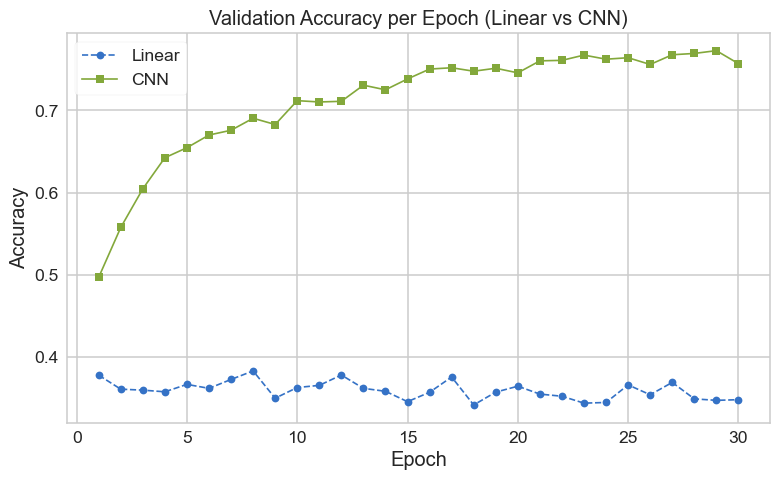

In [ ]:
plot_learning_curves(
    history_linear=linear_history,
    history_cnn=cnn_history,
    metric="val_acc",
    title="Validation Accuracy per Epoch (Linear vs CNN)"
)


The linear classifier shows a rapid convergence and quickly saturates at a low training accuracy, reflecting its limited capacity to model complex image patterns. In contrast, the CNN exhibits a steady and continuous improvement in training accuracy, demonstrating its ability to learn hierarchical and discriminative features from the data.

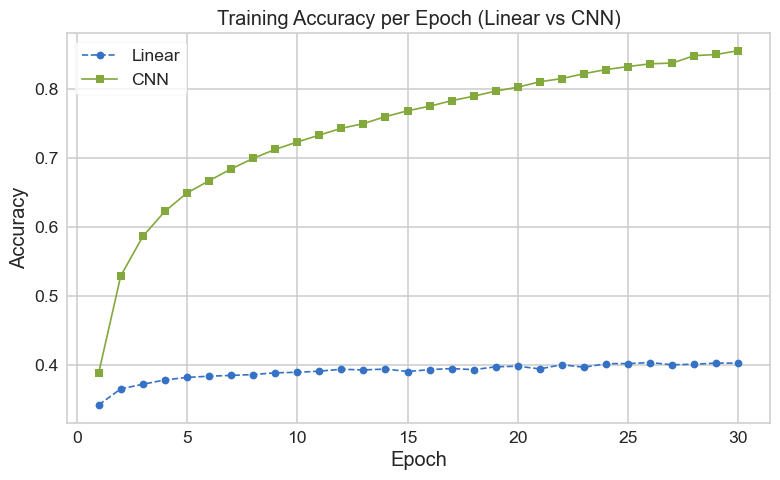

In [56]:
plot_learning_curves(
    history_linear=linear_history,
    history_cnn=cnn_history,
    metric="train_acc",
    title="Training Accuracy per Epoch (Linear vs CNN)"
)


The validation loss of the linear classifier remains high and nearly constant across epochs, indicating limited learning capacity. In contrast, the CNN shows a consistent decrease in validation loss, reflecting more effective feature learning and improved generalization.

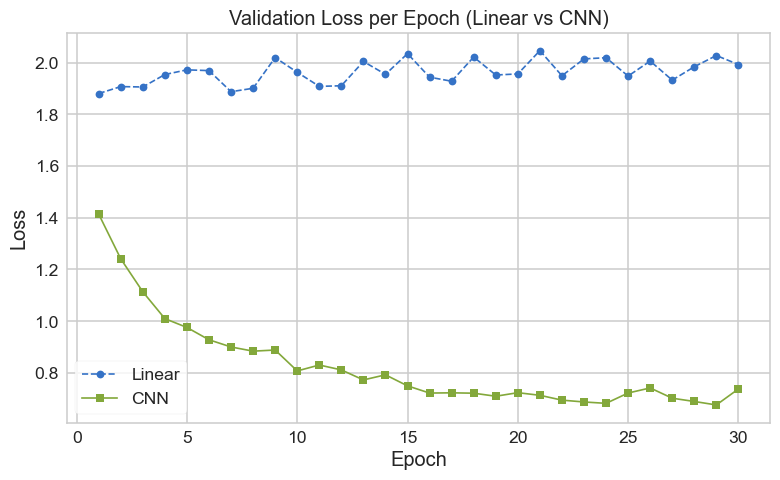

In [58]:
plot_learning_curves(
    history_linear=linear_history,
    history_cnn=cnn_history,
    metric="val_loss",
    title="Validation Loss per Epoch (Linear vs CNN)"
)


The linear model exhibits a small and stable train–validation accuracy gap, reflecting its limited capacity rather than strong generalization. The CNN shows a larger but controlled gap as training progresses, which is expected due to its higher representational power and does not indicate severe overfitting.

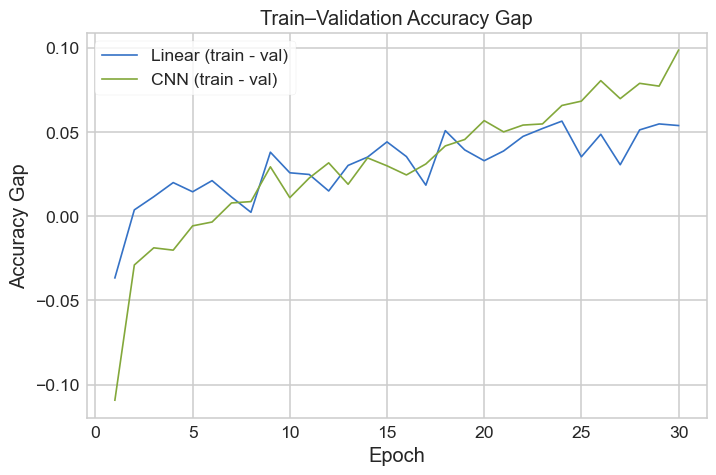

In [59]:
plt.figure(figsize=(8,5))

plt.plot(
    linear_history["epoch"],
    np.array(linear_history["train_acc"]) - np.array(linear_history["val_acc"]),
    label="Linear (train - val)"
)

plt.plot(
    cnn_history["epoch"],
    np.array(cnn_history["train_acc"]) - np.array(cnn_history["val_acc"]),
    label="CNN (train - val)"
)

plt.xlabel("Epoch")
plt.ylabel("Accuracy Gap")
plt.title("Train–Validation Accuracy Gap")
plt.grid(True)
plt.legend()
plt.show()


Linear Test Accuracy: 0.3228
CNN Test Accuracy: 0.7666


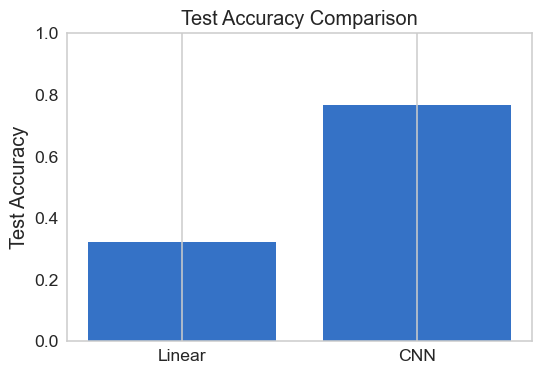

In [ ]:
linear_test_loss, linear_test_acc = accuracy(linear_model, test_loader)
print(f"Linear Test Accuracy: {linear_test_acc:.4f}")
cnn_test_loss, cnn_test_acc = accuracy(cnn_model, test_loader)
print(f"CNN Test Accuracy: {cnn_test_acc:.4f}")

models = ["Linear", "CNN"]
test_accs = [linear_test_acc, cnn_test_acc]

plt.figure(figsize=(6,4))
plt.bar(models, test_accs)
plt.ylabel("Test Accuracy")
plt.title("Test Accuracy Comparison")
plt.ylim(0, 1)
plt.grid(axis="y")
plt.show()


## Results

The linear classifier achieves moderate accuracy, consistent with known limitations of pixel-based models on CIFAR-10.

The CNN significantly outperforms the linear baseline, demonstrating:
- Better generalization
- Higher validation and test accuracy
- More stable learning dynamics

These results confirm that convolutional architectures are better suited for image classification tasks.
